# Amazon Fine Food Reviews Analysis


Data Source: https://www.kaggle.com/snap/amazon-fine-food-reviews <br>

EDA: https://nycdatascience.com/blog/student-works/amazon-fine-foods-visualization/


The Amazon Fine Food Reviews dataset consists of reviews of fine foods from Amazon.<br>

Number of reviews: 568,454<br>
Number of users: 256,059<br>
Number of products: 74,258<br>
Timespan: Oct 1999 - Oct 2012<br>
Number of Attributes/Columns in data: 10 

Attribute Information:

1. Id
2. ProductId - unique identifier for the product
3. UserId - unqiue identifier for the user
4. ProfileName
5. HelpfulnessNumerator - number of users who found the review helpful
6. HelpfulnessDenominator - number of users who indicated whether they found the review helpful or not
7. Score - rating between 1 and 5
8. Time - timestamp for the review
9. Summary - brief summary of the review
10. Text - text of the review


#### Objective:
Given a review, determine whether the review is positive (rating of 4 or 5) or negative (rating of 1 or 2).

<br>
[Q] How to determine if a review is positive or negative?<br>
<br> 
[Ans] We could use Score/Rating. A rating of 4 or 5 can be cosnidered as a positive review. A rating of 1 or 2 can be considered as negative one. A review of rating 3 is considered nuetral and such reviews are ignored from our analysis. This is an approximate and proxy way of determining the polarity (positivity/negativity) of a review.




# [1]. Reading Data

## [1.1] Loading the data

The dataset is available in two forms
1. .csv file
2. SQLite Database

In order to load the data, We have used the SQLITE dataset as it is easier to query the data and visualise the data efficiently.
<br> 

Here as we only want to get the global sentiment of the recommendations (positive or negative), we will purposefully ignore all Scores equal to 3. If the score is above 3, then the recommendation wil be set to "positive". Otherwise, it will be set to "negative".

In [1]:
#importing important libarary

%matplotlib inline
import warnings
warnings.filterwarnings("ignore")



import sqlite3
import pandas as pd
import numpy as np
import nltk
import string
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.metrics import roc_curve, auc
from nltk.stem.porter import PorterStemmer

import re
# Tutorial about Python regular expressions: https://pymotw.com/2/re/
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.stem.wordnet import WordNetLemmatizer

from gensim.models import Word2Vec
from gensim.models import KeyedVectors
import pickle

from tqdm import tqdm
import os
from bs4 import BeautifulSoup
from sklearn.model_selection import train_test_split

In [2]:
from sklearn import tree
from sklearn.calibration import CalibratedClassifierCV
import math
import graphviz 
from sklearn.tree import DecisionTreeClassifier
from sklearn.preprocessing import MaxAbsScaler
from wordcloud import WordCloud

In [3]:
con = sqlite3.connect("database.sqlite")

In [4]:
amzn = pd.read_sql_query('''SELECT * 
                            FROM Reviews 
                            WHERE Score != 3 
                            ORDER BY Time''', con)

In [5]:
def partition(score):
    if score < 3:
        return 0
    else : 
        return 1
amzn_score = amzn["Score"] 
filter_amzn = amzn_score.map(partition)
amzn['Score'] = filter_amzn

In [6]:
#sorting data
sorted_data = amzn.sort_values("ProductId", axis = 0, ascending = True, \
                       inplace = False, na_position = 'last')

In [7]:
#Deduplication of entries
final=sorted_data.drop_duplicates(subset={"UserId","ProfileName","Time","Text"}, keep='first', inplace=False)
final.shape

(364173, 10)

In [8]:
final['Score'].value_counts()

1    307063
0     57110
Name: Score, dtype: int64

In [9]:
final = final.iloc[0:30000]

In [10]:
# https://stackoverflow.com/a/47091490/4084039
import re

def decontracted(phrase):
    # specific
    phrase = re.sub(r"won't", "will not", phrase)
    phrase = re.sub(r"can\'t", "can not", phrase)

    # general
    phrase = re.sub(r"n\'t", " not", phrase)
    phrase = re.sub(r"\'re", " are", phrase)
    phrase = re.sub(r"\'s", " is", phrase)
    phrase = re.sub(r"\'d", " would", phrase)
    phrase = re.sub(r"\'ll", " will", phrase)
    phrase = re.sub(r"\'t", " not", phrase)
    phrase = re.sub(r"\'ve", " have", phrase)
    phrase = re.sub(r"\'m", " am", phrase)
    return phrase

In [11]:
# https://gist.github.com/sebleier/554280
# we are removing the words from the stop words list: 'no', 'nor', 'not'
# <br /><br /> ==> after the above steps, we are getting "br br"
# we are including them into stop words list
# instead of <br /> if we have <br/> these tags would have revmoved in the 1st step

stopwords= set(['br', 'the', 'i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've",\
            "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', \
            'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their',\
            'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', \
            'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', \
            'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', \
            'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after',\
            'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further',\
            'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more',\
            'most', 'other', 'some', 'such', 'only', 'own', 'same', 'so', 'than', 'too', 'very', \
            's', 't', 'can', 'will', 'just', 'don', "don't", 'should', "should've", 'now', 'd', 'll', 'm', 'o', 're', \
            've', 'y', 'ain', 'aren', "aren't", 'couldn', "couldn't", 'didn', "didn't", 'doesn', "doesn't", 'hadn',\
            "hadn't", 'hasn', "hasn't", 'haven', "haven't", 'isn', "isn't", 'ma', 'mightn', "mightn't", 'mustn',\
            "mustn't", 'needn', "needn't", 'shan', "shan't", 'shouldn', "shouldn't", 'wasn', "wasn't", 'weren', "weren't", \
            'won', "won't", 'wouldn', "wouldn't"])

In [12]:
# Combining all the above stundents 
from tqdm import tqdm
preprocessed_reviews = []
# tqdm is for printing the status bar
for sentance in tqdm(final['Text'].values):
    sentance = re.sub(r"http\S+", "", sentance)
    sentance = BeautifulSoup(sentance, 'lxml').get_text()
    sentance = decontracted(sentance)
    sentance = re.sub("\S*\d\S*", "", sentance).strip()
    sentance = re.sub('[^A-Za-z]+', ' ', sentance)
    # https://gist.github.com/sebleier/554280
    sentance = ' '.join(e.lower() for e in sentance.split() if e.lower() not in stopwords)
    preprocessed_reviews.append(sentance.strip())

100%|███████████████████████████████████| 30000/30000 [01:03<00:00, 471.53it/s]


In [67]:
#splitting data into train and test
x_train = preprocessed_reviews[slice(0,30000)]
x_cv = preprocessed_reviews[slice(0,100)]
x_test = preprocessed_reviews[slice(0,100)]

In [14]:
from sklearn.cluster import KMeans

### [5.1.1] Applying K-Means Clustering on BOW,<font color='red'> SET 1</font>

In [15]:
# Please write all the code with proper documentation

In [16]:
from sklearn.preprocessing import MaxAbsScaler
from wordcloud import WordCloud

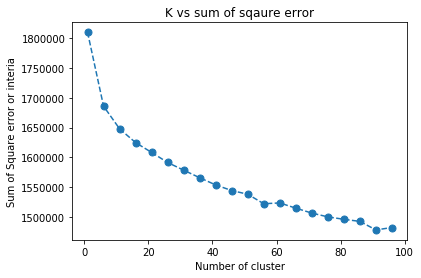

In [17]:
# Please write all the code with proper documentation
#defining function for Bag of words
from tqdm import tqdm_notebook as tqdm
def bow(para, bow_x_cv, bow_x_test):  
    count_vect = CountVectorizer() #in scikit-learn
    bow_x_train = count_vect.fit_transform(para)
    bow_x_cv = count_vect.transform(x_cv)
    bow_x_test = count_vect.transform(x_test)
    return bow_x_train, bow_x_cv, bow_x_test, count_vect



#vectorizing using above function
bow_x_train, bow_x_cv, bow_x_test, count_vect = bow(x_train, x_cv, x_test)




sse = {}
for k in tqdm(range(1,100, 5)):
    kmeans = KMeans(n_clusters=k).fit(bow_x_train)
    #print(data["clusters"])
    sse[k] = kmeans.inertia_ # Inertia: Sum of distances of samples to their closest cluster center

plt.figure()
plt.plot(list(sse.keys()), list(sse.values()), marker='o', linestyle='dashed', markersize=7)
plt.xlabel("Number of cluster")
plt.ylabel("Sum of Square error or interia")
plt.title("K vs sum of sqaure error")
plt.show()

        


In [69]:

kmeans = KMeans(n_clusters=18).fit(bow_x_train)

### [5.1.2] Wordclouds of clusters obtained after applying k-means on BOW<font color='red'> SET 1</font>

In [70]:
# Please write all the code with proper documentation

kmeans clustering of BoW


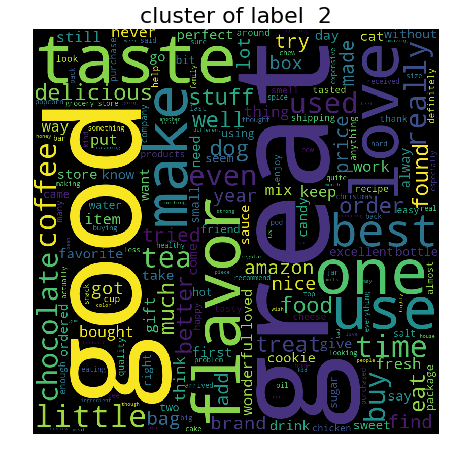

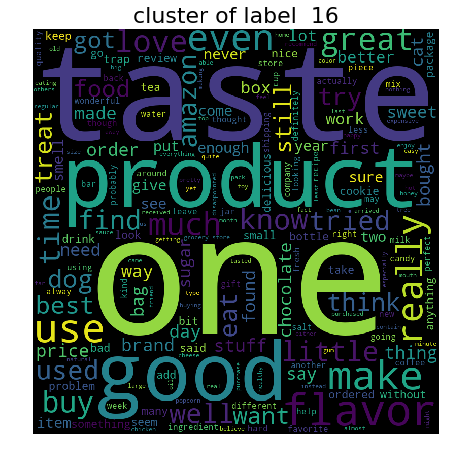

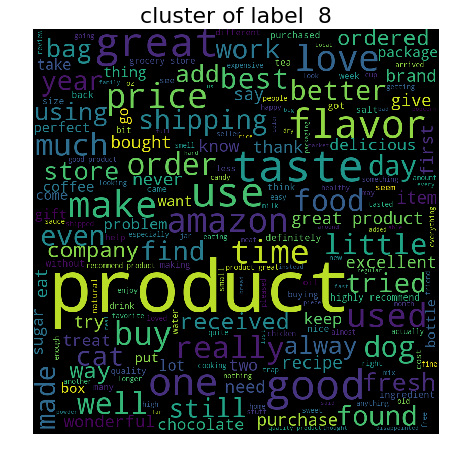

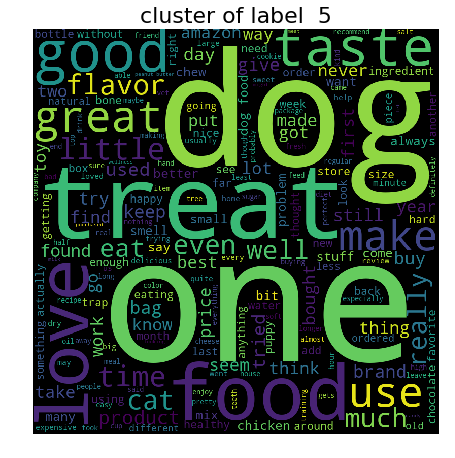

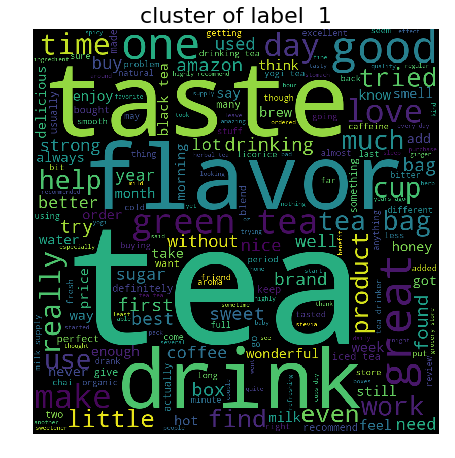

...

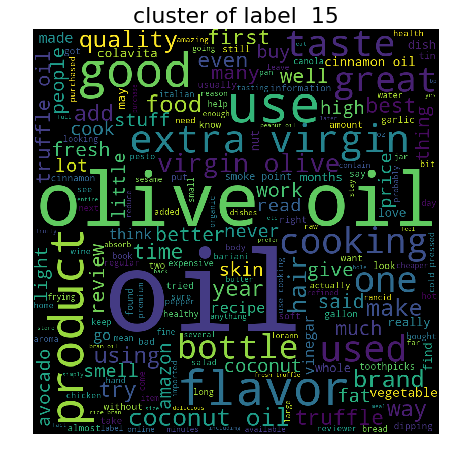

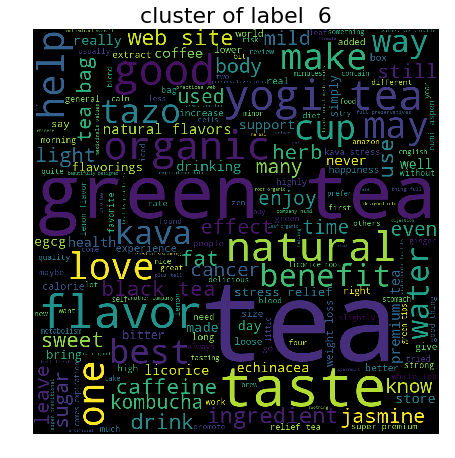

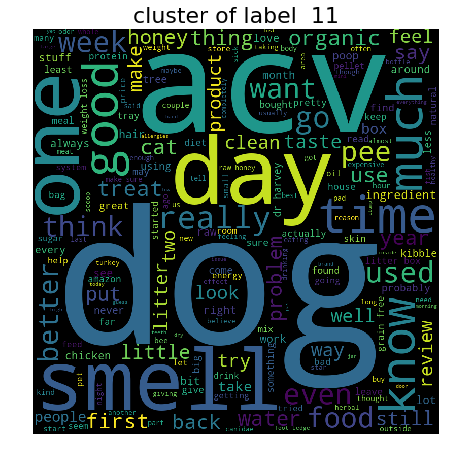

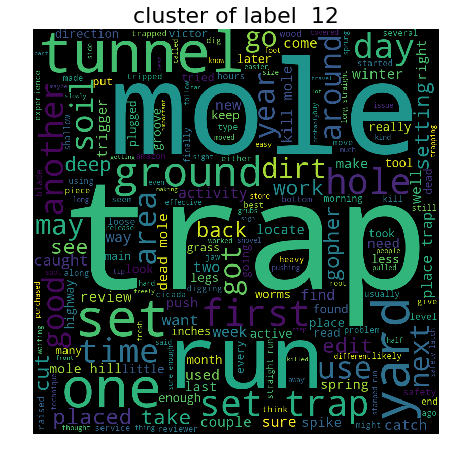

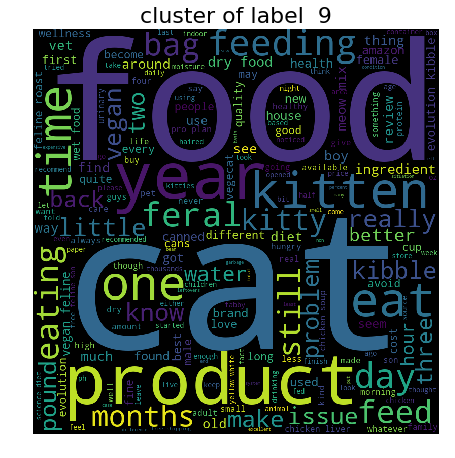

In [72]:
print("kmeans clustering of BoW")
label_df = pd.DataFrame(kmeans.labels_)

label = (kmeans.labels_).reshape(-1 )

text_label = pd.DataFrame(columns = {'Text', 'label'})
                                     
df = pd.DataFrame({'Text':  x_train,
                  'label' : label} )


for i in tqdm(label_df[0].value_counts().index):
    text_label.loc[i, 'label'] = i
    text_label.loc[i, 'Text'] = ''
    for j in range(len(df.label)):
        if i == df.iloc[j].label:
            text_label.loc[i, 'Text'] = str(text_label.loc[i, 'Text']) + df.iloc[j, 0]
            
for i in label_df[0].value_counts().index:
    if '' != text_label.loc[i].Text:
        wordcloud = WordCloud(width = 800, height = 800, 
                    background_color ='black',        
                    min_font_size = 5).generate(text_label.loc[i].Text)

        plt.figure(figsize = (6, 6), facecolor = None) 
        plt.imshow(wordcloud) 
        plt.axis("off") 
        plt.tight_layout(pad = 0) 
        plt.title("cluster of label  " + str(i), fontsize=22)  
        plt.show()                   
    else:
        print('cluster  label of ' +str(i) + ' has no words')

### [5.1.3] Applying K-Means Clustering on TFIDF,<font color='red'> SET 2</font>

In [ ]:
# Please write all the code with proper documentation

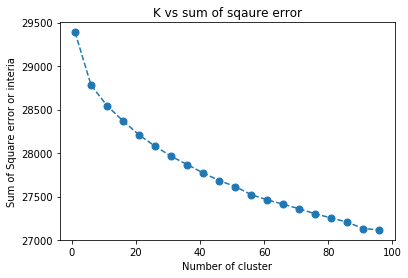

In [18]:
def tfidf(preprocessed_reviews, x_cv, x_test):
    tf_idf_vect = TfidfVectorizer()
    vectorizer = tf_idf_vect.fit_transform(preprocessed_reviews)
    tfidf_x_cv = tf_idf_vect.transform(x_cv)
    tfidf_x_test = tf_idf_vect.transform(x_test)
    return vectorizer, tfidf_x_cv, tfidf_x_test, tf_idf_vect



#vectorizing using above function
tfidf_x_train, tfidf_x_cv, tfidf_x_test, tfidf_vect = tfidf(x_train, x_cv, x_test)


sse = {}
for k in tqdm(range(1,100, 5)):
    kmeans = KMeans(n_clusters=k).fit(tfidf_x_train)
    #print(data["clusters"])
    sse[k] = kmeans.inertia_ # Inertia: Sum of distances of samples to their closest cluster center

plt.figure()
plt.plot(list(sse.keys()), list(sse.values()), marker='o', linestyle='dashed', markersize=7)
plt.xlabel("Number of cluster")
plt.ylabel("Sum of Square error or interia")
plt.title("K vs sum of sqaure error")
plt.show()

In [63]:

kmeans = KMeans(n_clusters=10).fit(tfidf_x_train)

### [5.1.4] Wordclouds of clusters obtained after applying k-means on TFIDF<font color='red'> SET 2</font>

In [64]:
# Please write all the code with proper documentation

kmeans clustering of tfidf


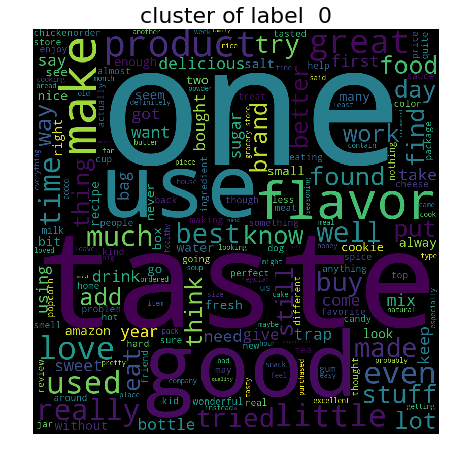

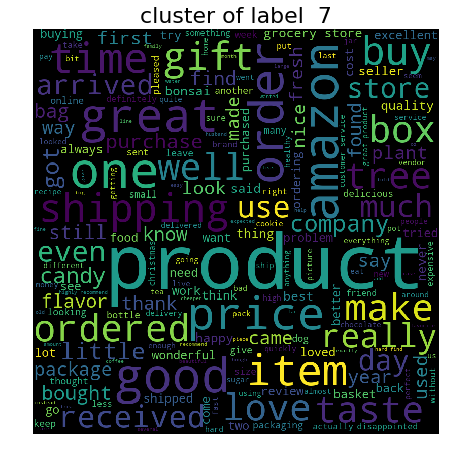

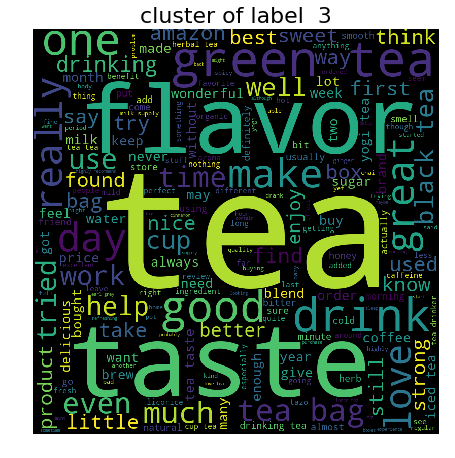

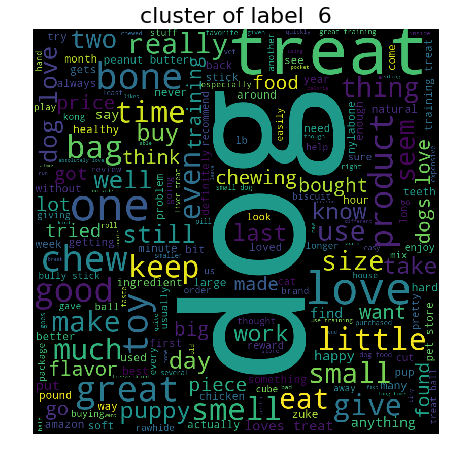

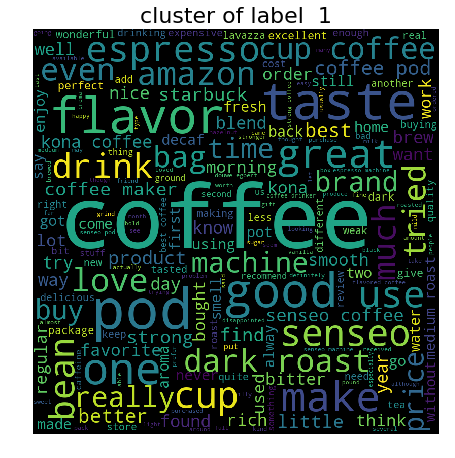

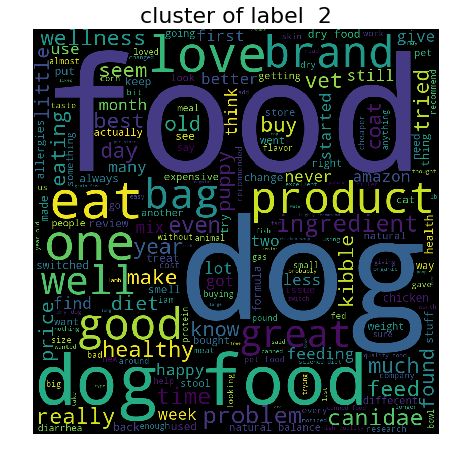

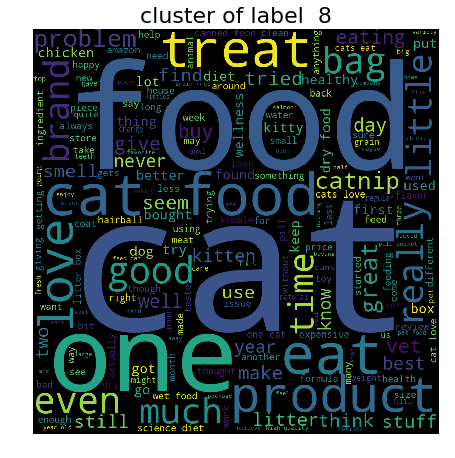

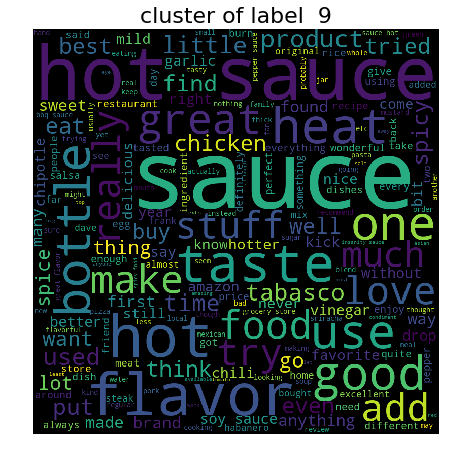

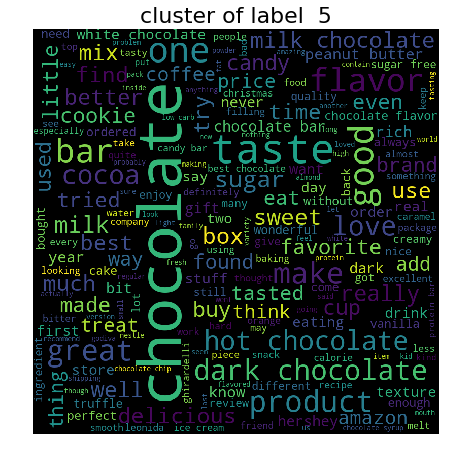

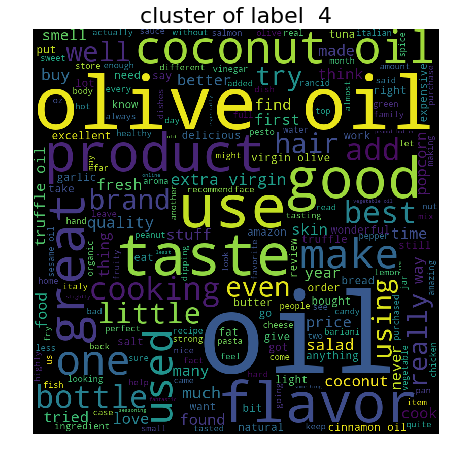

In [68]:
print("kmeans clustering of tfidf")
label_df = pd.DataFrame(kmeans.labels_)

label = (kmeans.labels_).reshape(-1 )

text_label = pd.DataFrame(columns = {'Text', 'label'})
                                     
df = pd.DataFrame({'Text':  x_train,
                  'label' : label} )


for i in label_df[0].value_counts().index:
    text_label.loc[i, 'label'] = i
    text_label.loc[i, 'Text'] = ''
    for j in range(len(df.label)):
        if i == df.iloc[j].label:
            text_label.loc[i, 'Text'] = str(text_label.loc[i, 'Text']) + df.iloc[j, 0]
            
for i in label_df[0].value_counts().index:
    if '' != text_label.loc[i].Text:
        wordcloud = WordCloud(width = 800, height = 800, 
                    background_color ='black',        
                    min_font_size = 5).generate(text_label.loc[i].Text)

        plt.figure(figsize = (6, 6), facecolor = None) 
        plt.imshow(wordcloud) 
        plt.axis("off") 
        plt.tight_layout(pad = 0) 
        plt.title("cluster of label  " + str(i), fontsize=22)  
        plt.show()                   
    else:
        print('cluster  label of ' +str(i) + ' has no words')

### [5.1.5] Applying K-Means Clustering on AVG W2V,<font color='red'> SET 3</font>

In [121]:
# Please write all the code with proper documentation
from tqdm import tqdm

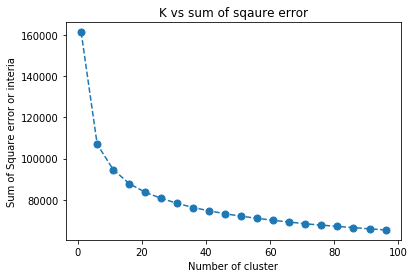

In [19]:
def avg_w2v(preprocessed_reviews, x, w2v_model):
    i=0
    list_of_sentance=[]
    for sentance in preprocessed_reviews:
        list_of_sentance.append(sentance.split())
                            
    is_your_ram_gt_16g=False
    want_to_use_google_w2v = False
    want_to_train_w2v = True
    if 1 == x:
        if want_to_train_w2v:
            # min_count = 5 considers only words that occured atleast 5 times
            w2v_model=Word2Vec(list_of_sentance,min_count=5,size=50, workers=4)
        elif want_to_use_google_w2v and is_your_ram_gt_16g:
            if os.path.isfile('GoogleNews-vectors-negative300.bin'):
                w2v_model=KeyedVectors.load_word2vec_format('GoogleNews-vectors-negative300.bin', binary=True)
                print(w2v_model.wv.most_similar('great'))
                print(w2v_model.wv.most_similar('worst'))
        else:
            print("you don't have gogole's word2vec file, keep want_to_train_w2v = True, to train your own w2v ")

    w2v_words = list(w2v_model.wv.vocab)                      

    # average Word2Vec
    # compute average word2vec for each review.
    sent_vectors = []; # the avg-w2v for each sentence/review is stored in this list
    for sent in tqdm(list_of_sentance): # for each review/sentence
        sent_vec = np.zeros(50) # as word vectors are of zero length 50, you might need to change this to 300 if you use google's w2v
        cnt_words =0; # num of words with a valid vector in the sentence/review
        for word in sent: # for each word in a review/sentence
            if word in w2v_words:
                vec = w2v_model.wv[word]
                sent_vec += vec
                cnt_words += 1
        if cnt_words != 0:
            sent_vec /= cnt_words
        sent_vectors.append(sent_vec) 
    
    return sent_vectors, list_of_sentance, w2v_model                          


#vectorizing using above function
avg_w2v_x_train, los_train, w2v_model = avg_w2v(x_train, 1, None)



sse = {}
for k in tqdm(range(1,100, 5)):
    kmeans = KMeans(n_clusters=k).fit(avg_w2v_x_train)
    #print(data["clusters"])
    sse[k] = kmeans.inertia_ # Inertia: Sum of distances of samples to their closest cluster center

plt.figure()
plt.plot(list(sse.keys()), list(sse.values()), marker='o', linestyle='dashed', markersize=7)
plt.xlabel("Number of cluster")
plt.ylabel("Sum of Square error or interia")
plt.title("K vs sum of sqaure error")
plt.show()

In [60]:

kmeans = KMeans(n_clusters=17).fit(avg_w2v_x_train)

### [5.1.6] Wordclouds of clusters obtained after applying k-means on AVG W2V<font color='red'> SET 3</font>

In [61]:
# Please write all the code with proper documentation

kmeans clustering of average word2vec


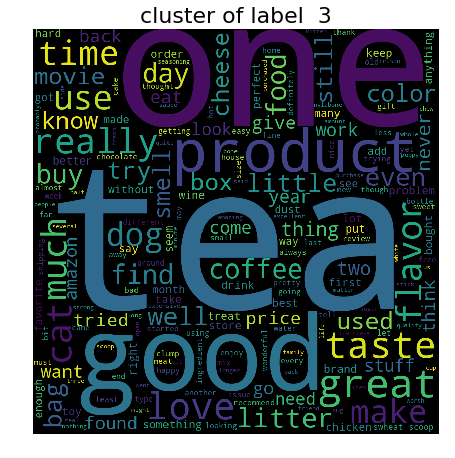

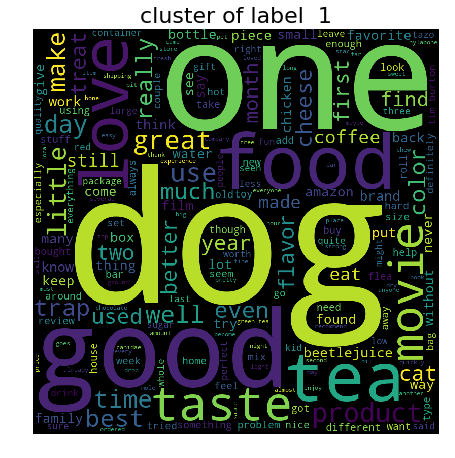

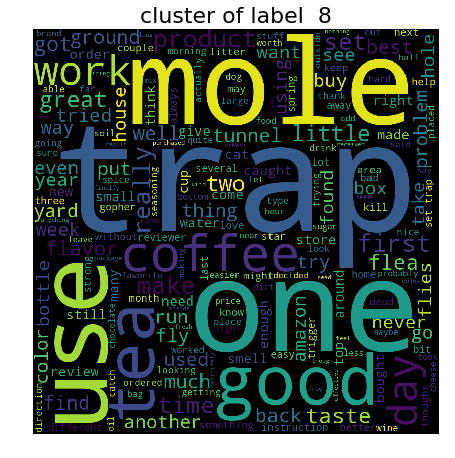

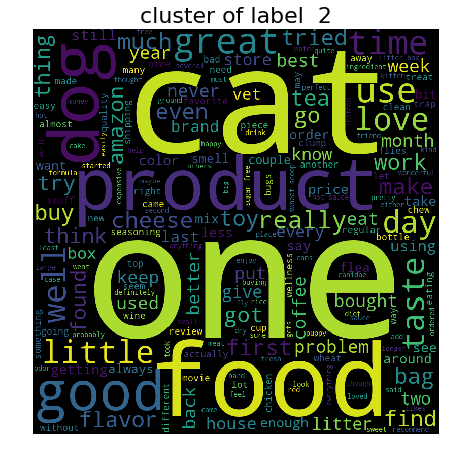

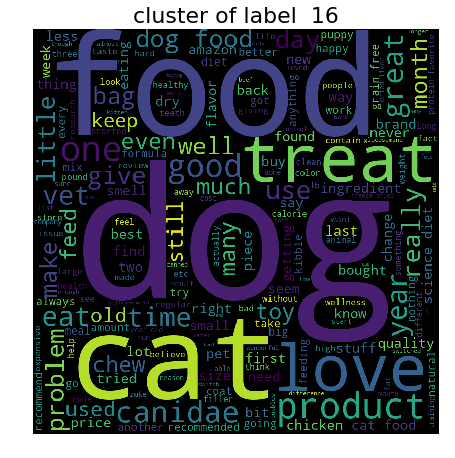

...

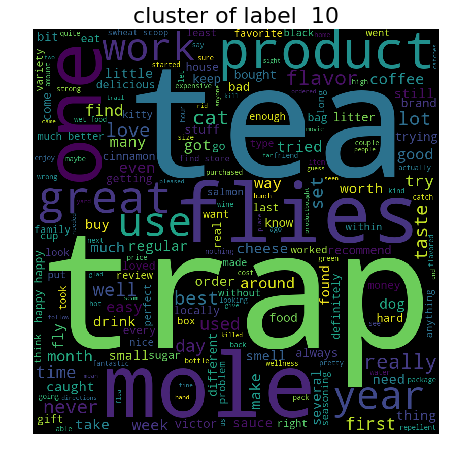

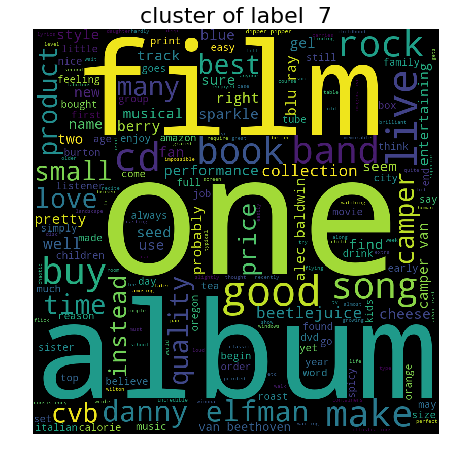

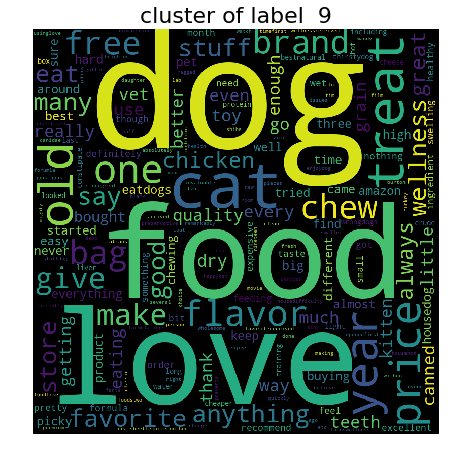

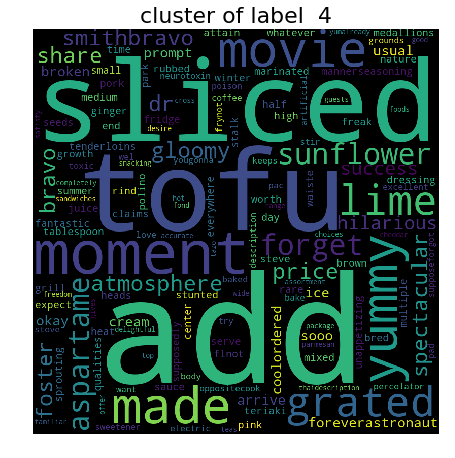

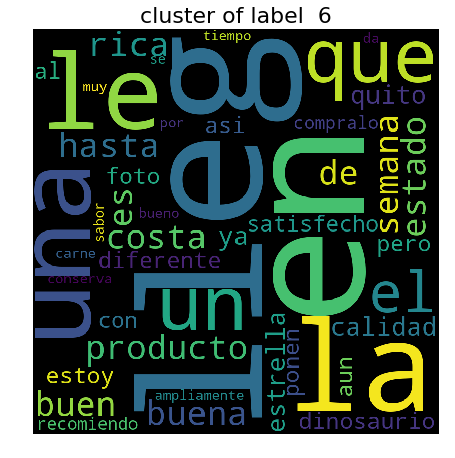

In [62]:
print("kmeans clustering of average word2vec")
label_df = pd.DataFrame(kmeans.labels_)

label = (kmeans.labels_).reshape(-1 )

text_label = pd.DataFrame(columns = {'Text', 'label'})
                                     
df = pd.DataFrame({'Text':  x_train,
                  'label' : label} )


for i in label_df[0].value_counts().index:
    text_label.loc[i, 'label'] = i
    text_label.loc[i, 'Text'] = ''
    for j in range(len(df.label)):
        if i == df.iloc[j].label:
            text_label.loc[i, 'Text'] = str(text_label.loc[i, 'Text']) + df.iloc[j, 0]
            
for i in label_df[0].value_counts().index:
    if '' != text_label.loc[i].Text:
        wordcloud = WordCloud(width = 800, height = 800, 
                    background_color ='black',        
                    min_font_size = 5).generate(text_label.loc[i].Text)

        plt.figure(figsize = (6, 6), facecolor = None) 
        plt.imshow(wordcloud) 
        plt.axis("off") 
        plt.tight_layout(pad = 0) 
        plt.title("cluster of label  " + str(i), fontsize=22)  
        plt.show()                   
    else:
        print('cluster  label of ' +str(i) + ' has no words')

### [5.1.7] Applying K-Means Clustering on TFIDF W2V,<font color='red'> SET 4</font>

In [126]:
# Please write all the code with proper documentation

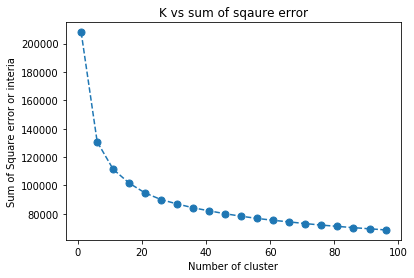

In [20]:
def tfidf_w2v(preprocessed_reviews, list_of_sentance, w2v_model, w2v_words, x, model):
    if 1 == x:
        model = TfidfVectorizer()
        tf_idf_matrix = model.fit_transform(preprocessed_reviews)
        # we are converting a dictionary with word as a key, and the idf as a value
        dictionary = dict(zip(model.get_feature_names(), list(model.idf_)))
        # TF-IDF weighted Word2Vec
        tfidf_feat = model.get_feature_names() # tfidf words/col-names
        # final_tf_idf is the sparse matrix with row= sentence, col=word and cell_val = tfidf
    else: 
        tf_idf_matrix = model.transform(preprocessed_reviews)
        dictionary = dict(zip(model.get_feature_names(), list(model.idf_)))
        tfidf_feat = model.get_feature_names()
        
    tfidf_sent_vectors = []; # the tfidf-w2v for each sentence/review is stored in this list
    row=0;
    for sent in tqdm(list_of_sentance): # for each review/sentence 
        sent_vec = np.zeros(50) # as word vectors are of zero length
        weight_sum =0; # num of words with a valid vector in the sentence/review
        for word in sent: # for each word in a review/sentence
            if word in w2v_words and word in tfidf_feat:
                vec = w2v_model.wv[word]
                # tf_idf = tf_idf_matrix[row, tfidf_feat.index(word)]
                # to reduce the computation we are  
                # dictionary[word] = idf value of word in whole courpus
                # sent.count(word) = tf valeus of word in this review
                tf_idf = dictionary[word]*(sent.count(word)/len(sent))
                sent_vec += (vec * tf_idf)
                weight_sum += tf_idf
        if weight_sum != 0:
            sent_vec /= weight_sum
        tfidf_sent_vectors.append(sent_vec)
        row += 1
    return tfidf_sent_vectors, model               


#vectorizing using above function
tfidf_w2v_x_train, model = tfidf_w2v(x_train, los_train, w2v_model, list(w2v_model.wv.vocab), 1, None)



sse = {}
for k in tqdm(range(1,100, 5)):
    kmeans = KMeans(n_clusters=k).fit(tfidf_w2v_x_train)
    #print(data["clusters"])
    sse[k] = kmeans.inertia_ # Inertia: Sum of distances of samples to their closest cluster center

plt.figure()
plt.plot(list(sse.keys()), list(sse.values()), marker='o', linestyle='dashed', markersize=7)
plt.xlabel("Number of cluster")
plt.ylabel("Sum of Square error or interia")
plt.title("K vs sum of sqaure error")
plt.show()

In [57]:

kmeans = KMeans(n_clusters=18).fit(tfidf_w2v_x_train)

### [5.1.8] Wordclouds of clusters obtained after applying k-means on TFIDF W2V<font color='red'> SET 4</font>

In [58]:
# Please write all the code with proper documentation

kmeans clustering of tfidf word2vec


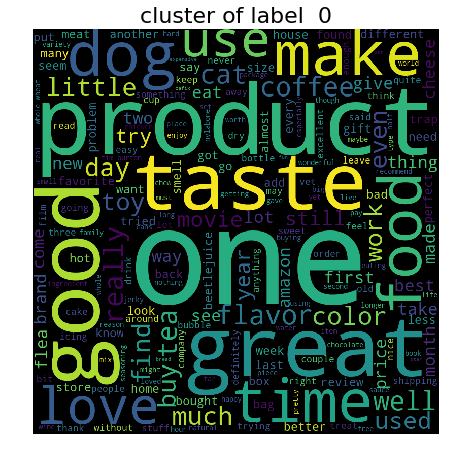

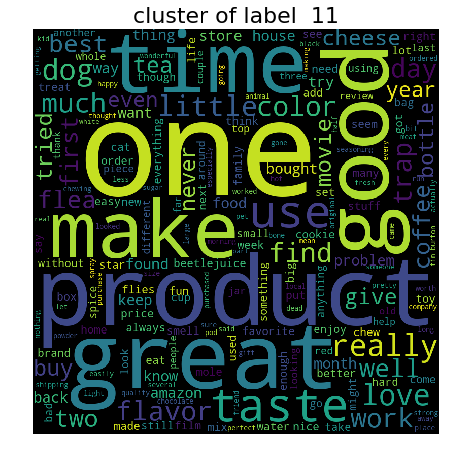

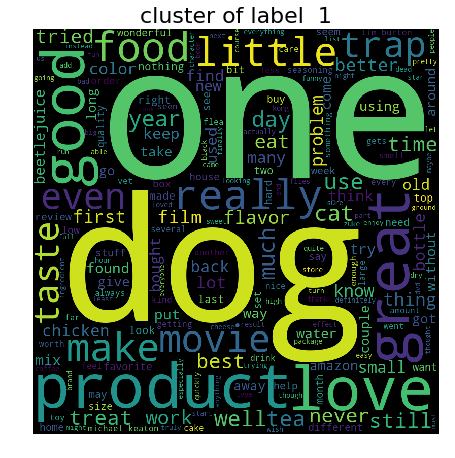

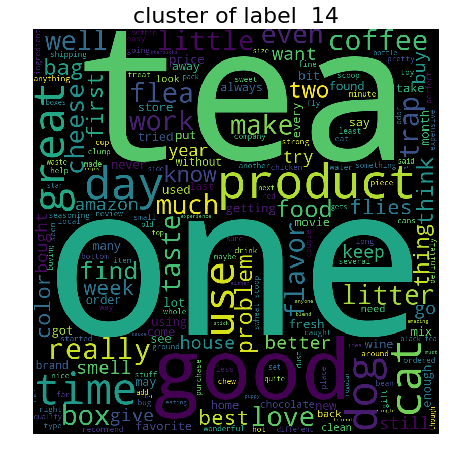

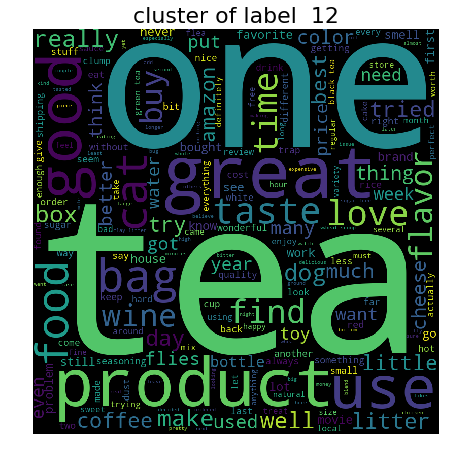

...

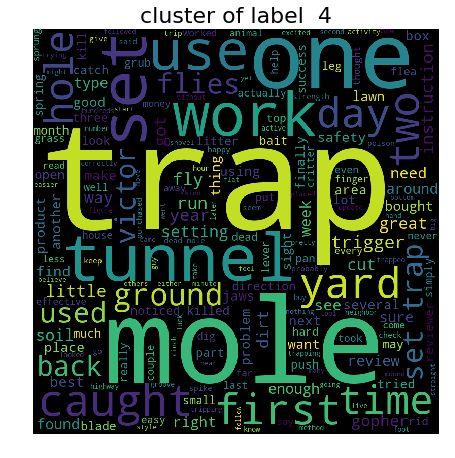

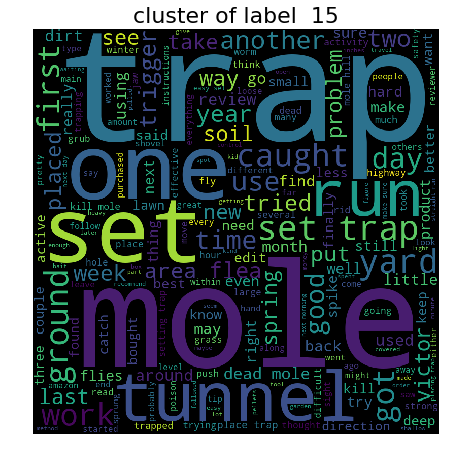

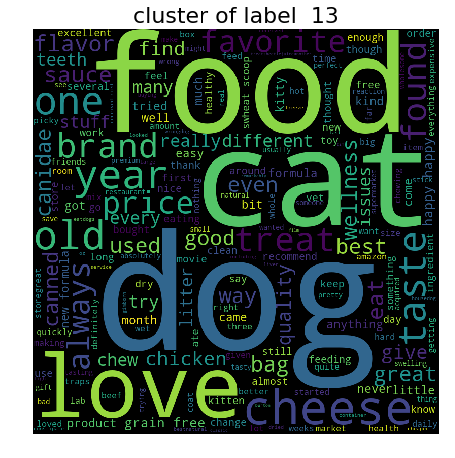

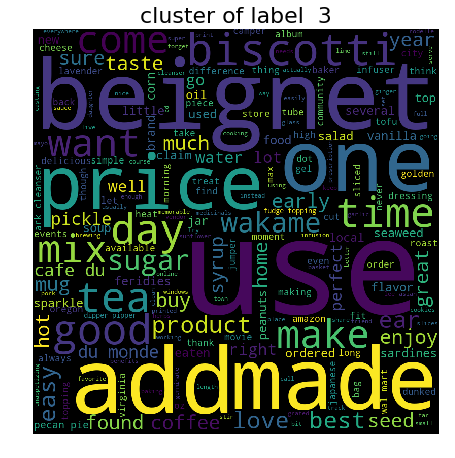

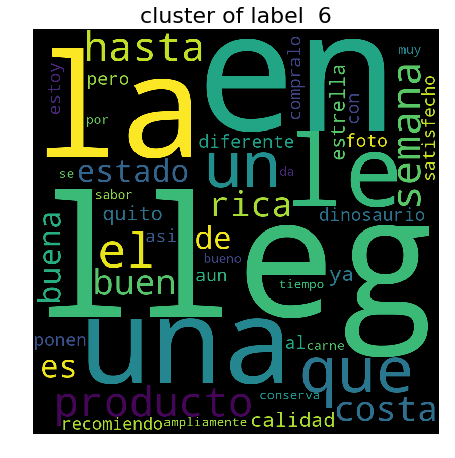

In [59]:
print("kmeans clustering of tfidf word2vec")
label_df = pd.DataFrame(kmeans.labels_)

label = (kmeans.labels_).reshape(-1 )

text_label = pd.DataFrame(columns = {'Text', 'label'})
                                     
df = pd.DataFrame({'Text':  x_train,
                  'label' : label} )


for i in label_df[0].value_counts().index:
    text_label.loc[i, 'label'] = i
    text_label.loc[i, 'Text'] = ''
    for j in range(len(df.label)):
        if i == df.iloc[j].label:
            text_label.loc[i, 'Text'] = str(text_label.loc[i, 'Text']) + df.iloc[j, 0]
            
for i in label_df[0].value_counts().index:
    if '' != text_label.loc[i].Text:
        wordcloud = WordCloud(width = 800, height = 800, 
                    background_color ='black',        
                    min_font_size = 5).generate(text_label.loc[i].Text)

        plt.figure(figsize = (6, 6), facecolor = None) 
        plt.imshow(wordcloud) 
        plt.axis("off") 
        plt.tight_layout(pad = 0) 
        plt.title("cluster of label  " + str(i), fontsize=22)  
        plt.show()                   
    else:
        print('cluster  label of ' +str(i) + ' has no words')

## [5.2] Agglomerative Clustering

In [21]:
#splitting data into train and test
x_train = preprocessed_reviews[slice(3500)]
x_cv = preprocessed_reviews[slice(0,100)]
x_test = preprocessed_reviews[slice(0,100)]

In [22]:
from sklearn.cluster import AgglomerativeClustering

### [5.2.1] Applying Agglomerative Clustering on AVG W2V,<font color='red'> SET 3</font>

In [23]:
# Please write all the code with proper documentation

In [24]:
def avg_w2v(preprocessed_reviews, x, w2v_model):
    i=0
    list_of_sentance=[]
    for sentance in preprocessed_reviews:
        list_of_sentance.append(sentance.split())
                            
    is_your_ram_gt_16g=False
    want_to_use_google_w2v = False
    want_to_train_w2v = True
    if 1 == x:
        if want_to_train_w2v:
            # min_count = 5 considers only words that occured atleast 5 times
            w2v_model=Word2Vec(list_of_sentance,min_count=5,size=50, workers=4)
        elif want_to_use_google_w2v and is_your_ram_gt_16g:
            if os.path.isfile('GoogleNews-vectors-negative300.bin'):
                w2v_model=KeyedVectors.load_word2vec_format('GoogleNews-vectors-negative300.bin', binary=True)
                print(w2v_model.wv.most_similar('great'))
                print(w2v_model.wv.most_similar('worst'))
        else:
            print("you don't have gogole's word2vec file, keep want_to_train_w2v = True, to train your own w2v ")

    w2v_words = list(w2v_model.wv.vocab)                      

    # average Word2Vec
    # compute average word2vec for each review.
    sent_vectors = []; # the avg-w2v for each sentence/review is stored in this list
    for sent in tqdm(list_of_sentance): # for each review/sentence
        sent_vec = np.zeros(50) # as word vectors are of zero length 50, you might need to change this to 300 if you use google's w2v
        cnt_words =0; # num of words with a valid vector in the sentence/review
        for word in sent: # for each word in a review/sentence
            if word in w2v_words:
                vec = w2v_model.wv[word]
                sent_vec += vec
                cnt_words += 1
        if cnt_words != 0:
            sent_vec /= cnt_words
        sent_vectors.append(sent_vec) 
    
    return sent_vectors, list_of_sentance, w2v_model                          


#vectorizing using above function
avg_w2v_x_train, los_train, w2v_model = avg_w2v(x_train, 1, None)


agg_cls_3 = AgglomerativeClustering(n_clusters =3, linkage='ward').fit(avg_w2v_x_train)

agg_cls_7 = AgglomerativeClustering(n_clusters =7, linkage='complete').fit(avg_w2v_x_train)

agg_cls_10 = AgglomerativeClustering(n_clusters =10, linkage='average').fit(avg_w2v_x_train)


### [5.2.2] Wordclouds of clusters obtained after applying Agglomerative Clustering on AVG W2V<font color='red'> SET 3</font>

In [25]:
# Please write all the code with proper documentation

Aggolomerative clustering of avg word2vec, number of cluster is 3


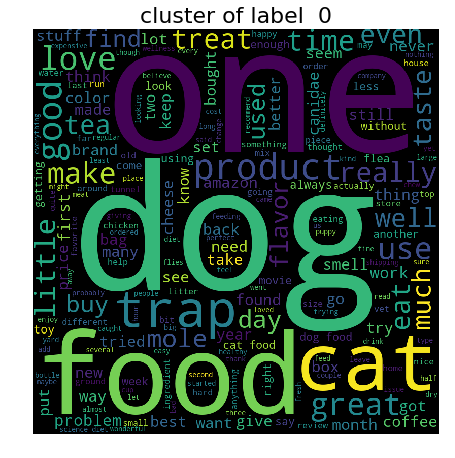

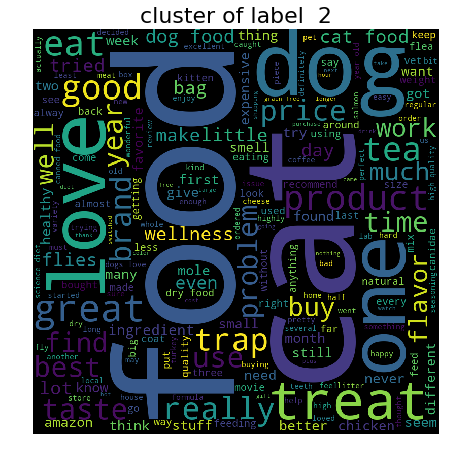

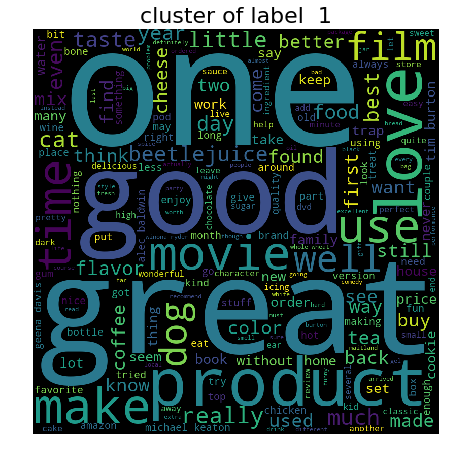

In [26]:
print("Aggolomerative clustering of avg word2vec, number of cluster is 3")
label_df = pd.DataFrame(agg_cls_3.labels_)

label = (agg_cls_3.labels_).reshape(-1 )

text_label = pd.DataFrame(columns = {'Text', 'label'})
                                     
df = pd.DataFrame({'Text':  x_train,
                  'label' : label} )


for i in label_df[0].value_counts().index:
    text_label.loc[i, 'label'] = i
    text_label.loc[i, 'Text'] = ''
    for j in range(len(df.label)):
        if i == df.iloc[j].label:
            text_label.loc[i, 'Text'] = str(text_label.loc[i, 'Text']) + df.iloc[j, 0]
            
for i in label_df[0].value_counts().index:
    if '' != text_label.loc[i].Text:
        wordcloud = WordCloud(width = 800, height = 800, 
                    background_color ='black',        
                    min_font_size = 5).generate(text_label.loc[i].Text)

        plt.figure(figsize = (6, 6), facecolor = None) 
        plt.imshow(wordcloud) 
        plt.axis("off") 
        plt.tight_layout(pad = 0) 
        plt.title("cluster of label  " + str(i), fontsize=22)  
        plt.show()                   
    else:
        print('cluster  label of ' +str(i) + ' has no words')

Aggolomerative clustering of avg word2vec, number of cluster is 7


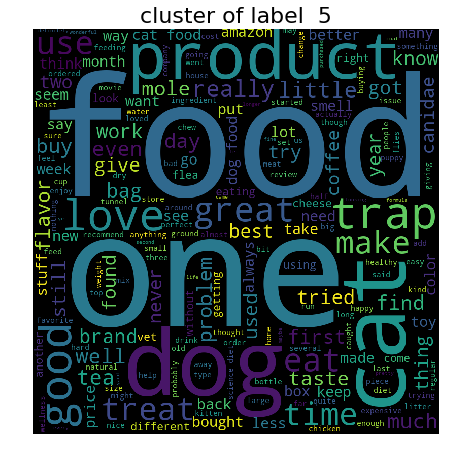

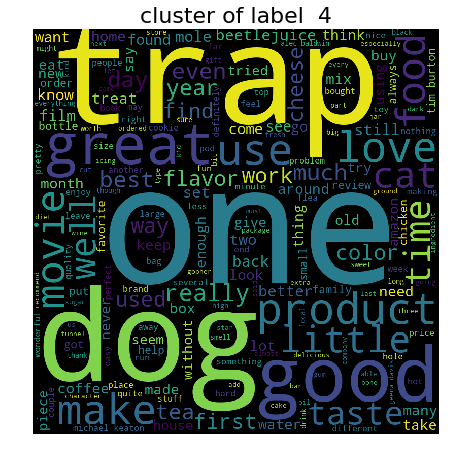

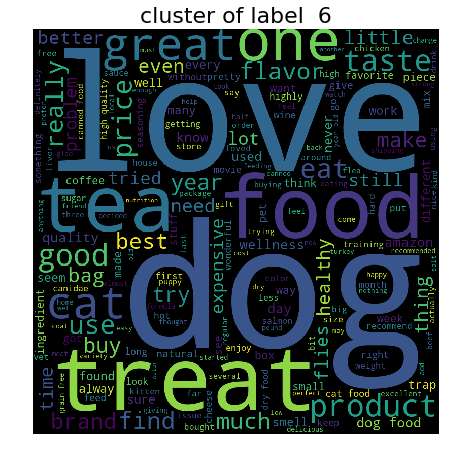

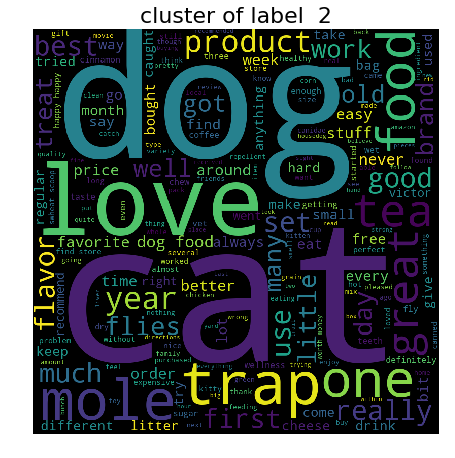

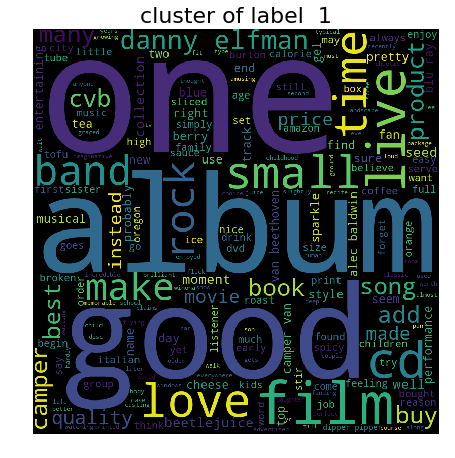

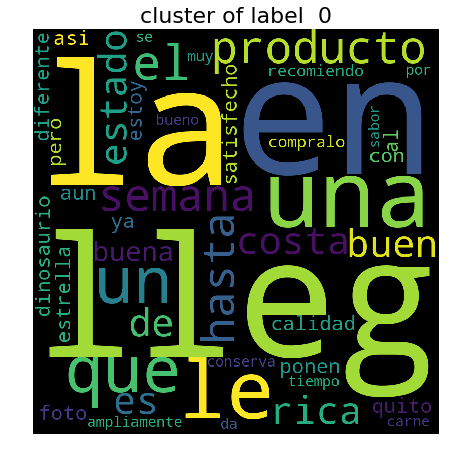

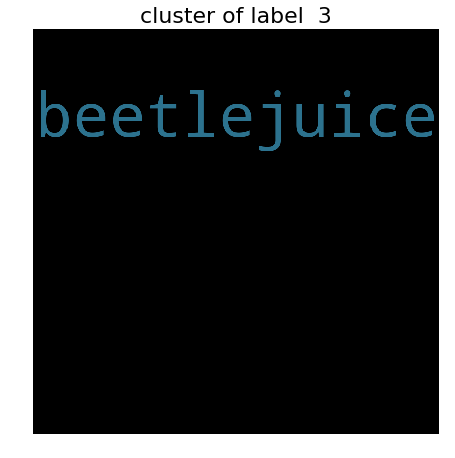

In [27]:
print("Aggolomerative clustering of avg word2vec, number of cluster is 7")
label_df = pd.DataFrame(agg_cls_7.labels_)

label = (agg_cls_7.labels_).reshape(-1 )

text_label = pd.DataFrame(columns = {'Text', 'label'})
                                     
df = pd.DataFrame({'Text':  x_train,
                  'label' : label} )


for i in label_df[0].value_counts().index:
    text_label.loc[i, 'label'] = i
    text_label.loc[i, 'Text'] = ''
    for j in range(len(df.label)):
        if i == df.iloc[j].label:
            text_label.loc[i, 'Text'] = str(text_label.loc[i, 'Text']) + df.iloc[j, 0]
            
for i in label_df[0].value_counts().index:
    if '' != text_label.loc[i].Text:
        wordcloud = WordCloud(width = 800, height = 800, 
                    background_color ='black',        
                    min_font_size = 5).generate(text_label.loc[i].Text)

        plt.figure(figsize = (6, 6), facecolor = None) 
        plt.imshow(wordcloud) 
        plt.axis("off") 
        plt.tight_layout(pad = 0) 
        plt.title("cluster of label  " + str(i), fontsize=22)  
        plt.show()                   
    else:
        print('cluster  label of ' +str(i) + ' has no words')

Aggolomerative clustering of avg word2vec, number of cluster is 10


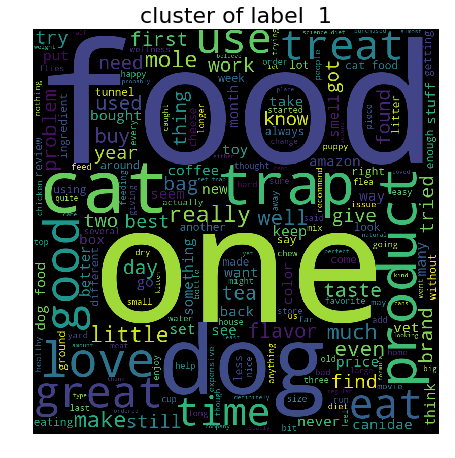

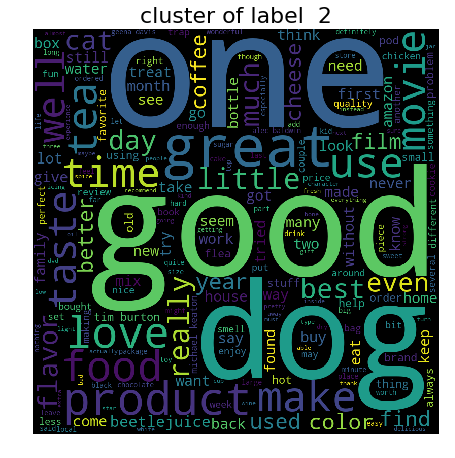

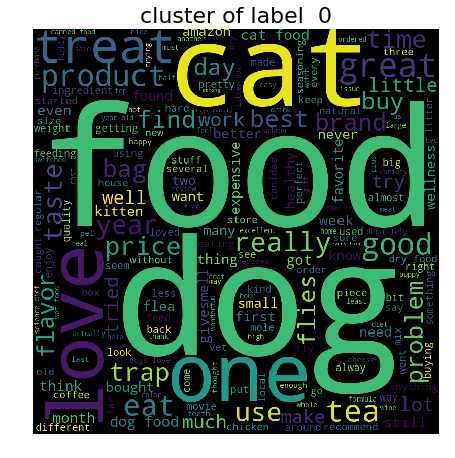

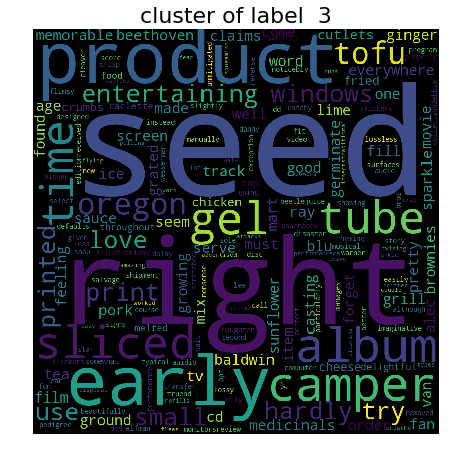

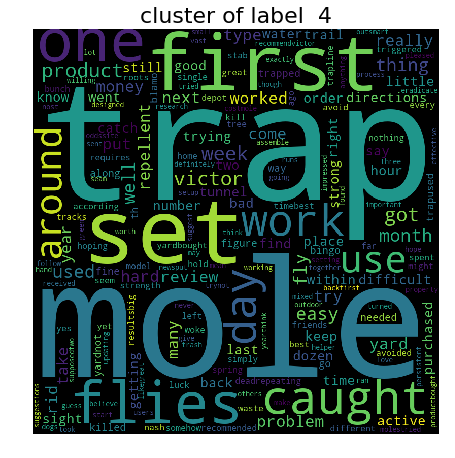

cluster  label of 5 has no words


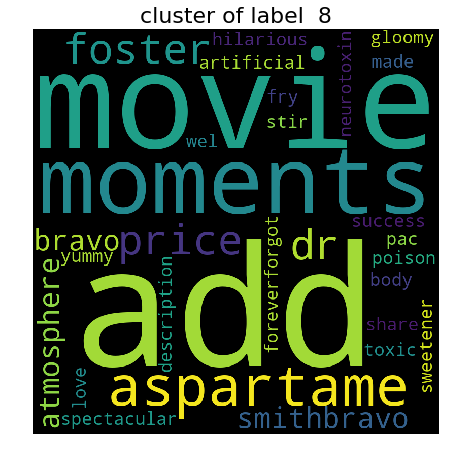

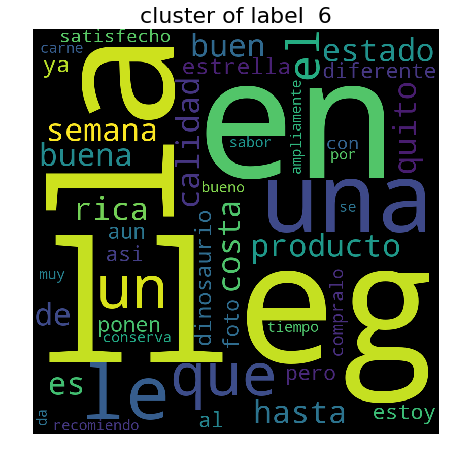

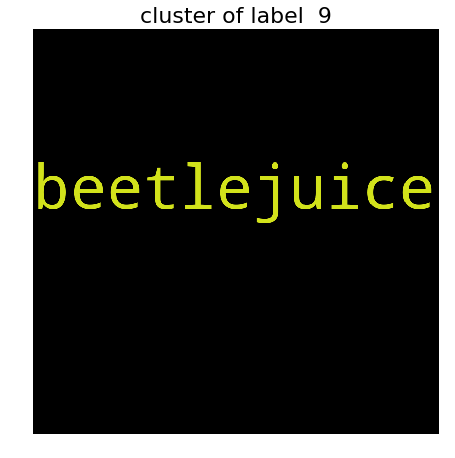

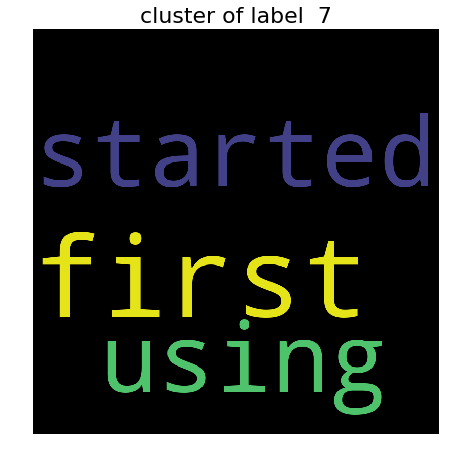

In [28]:
print("Aggolomerative clustering of avg word2vec, number of cluster is 10")
label_df = pd.DataFrame(agg_cls_10.labels_)

label = (agg_cls_10.labels_).reshape(-1 )

text_label = pd.DataFrame(columns = {'Text', 'label'})
                                     
df = pd.DataFrame({'Text':  x_train,
                  'label' : label} )


for i in label_df[0].value_counts().index:
    text_label.loc[i, 'label'] = i
    text_label.loc[i, 'Text'] = ''
    for j in range(len(df.label)):
        if i == df.iloc[j].label:
            text_label.loc[i, 'Text'] = str(text_label.loc[i, 'Text']) + df.iloc[j, 0]
            
for i in label_df[0].value_counts().index:
    if '' != text_label.loc[i].Text:
        wordcloud = WordCloud(width = 800, height = 800, 
                    background_color ='black',        
                    min_font_size = 5).generate(text_label.loc[i].Text)

        plt.figure(figsize = (6, 6), facecolor = None) 
        plt.imshow(wordcloud) 
        plt.axis("off") 
        plt.tight_layout(pad = 0) 
        plt.title("cluster of label  " + str(i), fontsize=22)  
        plt.show()                   
    else:
        print('cluster  label of ' +str(i) + ' has no words')

### [5.2.3] Applying Agglomerative Clustering on TFIDF W2V,<font color='red'> SET 4</font>

In [29]:
# Please write all the code with proper documentation

In [30]:
def tfidf_w2v(preprocessed_reviews, list_of_sentance, w2v_model, w2v_words, x, model):
    if 1 == x:
        model = TfidfVectorizer()
        tf_idf_matrix = model.fit_transform(preprocessed_reviews)
        # we are converting a dictionary with word as a key, and the idf as a value
        dictionary = dict(zip(model.get_feature_names(), list(model.idf_)))
        # TF-IDF weighted Word2Vec
        tfidf_feat = model.get_feature_names() # tfidf words/col-names
        # final_tf_idf is the sparse matrix with row= sentence, col=word and cell_val = tfidf
    else: 
        tf_idf_matrix = model.transform(preprocessed_reviews)
        dictionary = dict(zip(model.get_feature_names(), list(model.idf_)))
        tfidf_feat = model.get_feature_names()
        
    tfidf_sent_vectors = []; # the tfidf-w2v for each sentence/review is stored in this list
    row=0;
    for sent in tqdm(list_of_sentance): # for each review/sentence 
        sent_vec = np.zeros(50) # as word vectors are of zero length
        weight_sum =0; # num of words with a valid vector in the sentence/review
        for word in sent: # for each word in a review/sentence
            if word in w2v_words and word in tfidf_feat:
                vec = w2v_model.wv[word]
                # tf_idf = tf_idf_matrix[row, tfidf_feat.index(word)]
                # to reduce the computation we are  
                # dictionary[word] = idf value of word in whole courpus
                # sent.count(word) = tf valeus of word in this review
                tf_idf = dictionary[word]*(sent.count(word)/len(sent))
                sent_vec += (vec * tf_idf)
                weight_sum += tf_idf
        if weight_sum != 0:
            sent_vec /= weight_sum
        tfidf_sent_vectors.append(sent_vec)
        row += 1
    return tfidf_sent_vectors, model               


#vectorizing using above function
tfidf_w2v_x_train, model = tfidf_w2v(x_train, los_train, w2v_model, list(w2v_model.wv.vocab), 1, None)



agg_cls_3 = AgglomerativeClustering(n_clusters =3, linkage='ward').fit(tfidf_w2v_x_train)

agg_cls_7 = AgglomerativeClustering(n_clusters =7, linkage='complete').fit(tfidf_w2v_x_train)

agg_cls_10 = AgglomerativeClustering(n_clusters =10, linkage='average').fit(tfidf_w2v_x_train)


### [5.2.4] Wordclouds of clusters obtained after applying Agglomerative Clustering on TFIDF W2V<font color='red'> SET 4</font>

In [31]:
# Please write all the code with proper documentation

Aggolomerative clustering, number of cluster is 3


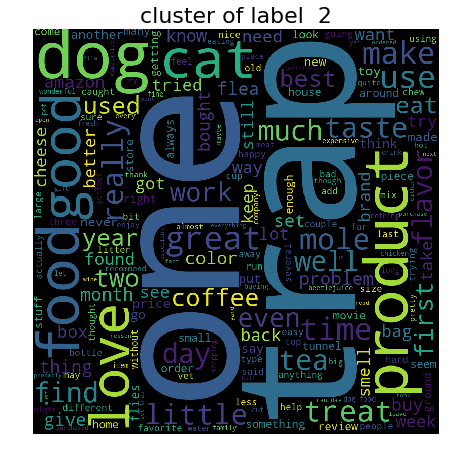

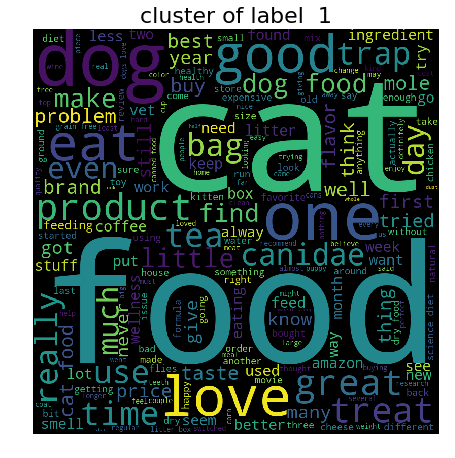

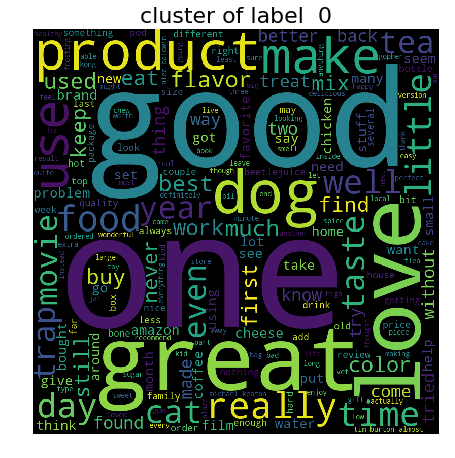

In [32]:
print("Aggolomerative clustering, number of cluster is 3")
label_df = pd.DataFrame(agg_cls_3.labels_)

label = (agg_cls_3.labels_).reshape(-1 )

text_label = pd.DataFrame(columns = {'Text', 'label'})
                                     
df = pd.DataFrame({'Text':  x_train,
                  'label' : label} )


for i in label_df[0].value_counts().index:
    text_label.loc[i, 'label'] = i
    text_label.loc[i, 'Text'] = ''
    for j in range(len(df.label)):
        if i == df.iloc[j].label:
            text_label.loc[i, 'Text'] = str(text_label.loc[i, 'Text']) + df.iloc[j, 0]
            
for i in label_df[0].value_counts().index:
    if '' != text_label.loc[i].Text:
        wordcloud = WordCloud(width = 800, height = 800, 
                    background_color ='black',        
                    min_font_size = 5).generate(text_label.loc[i].Text)

        plt.figure(figsize = (6, 6), facecolor = None) 
        plt.imshow(wordcloud) 
        plt.axis("off") 
        plt.tight_layout(pad = 0) 
        plt.title("cluster of label  " + str(i), fontsize=22)  
        plt.show()                   
    else:
        print('cluster  label of ' +str(i) + ' has no words')

Aggolomerative clustering, number of cluster is 7


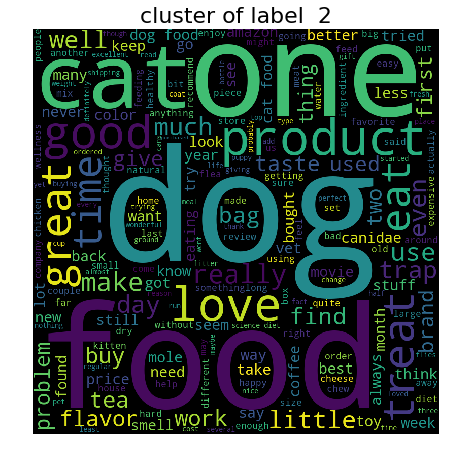

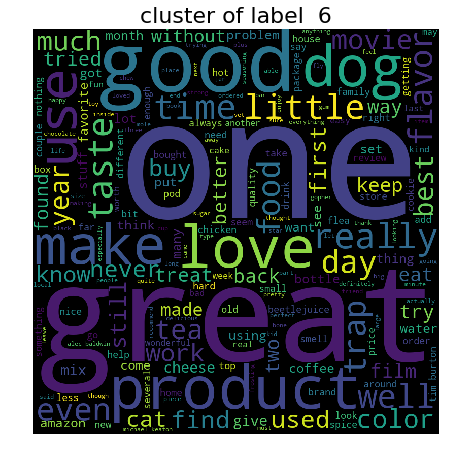

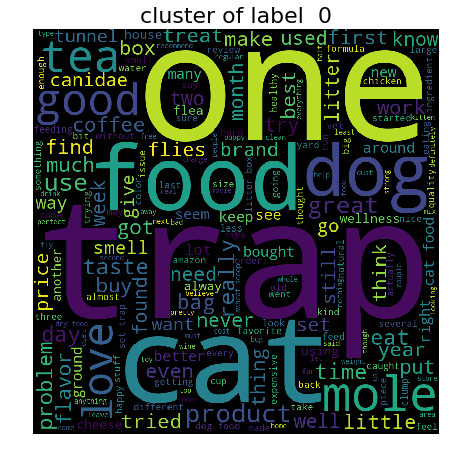

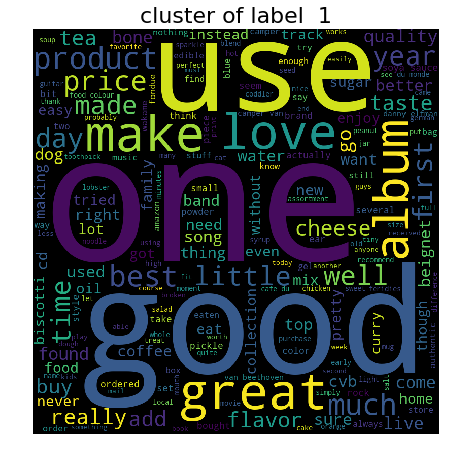

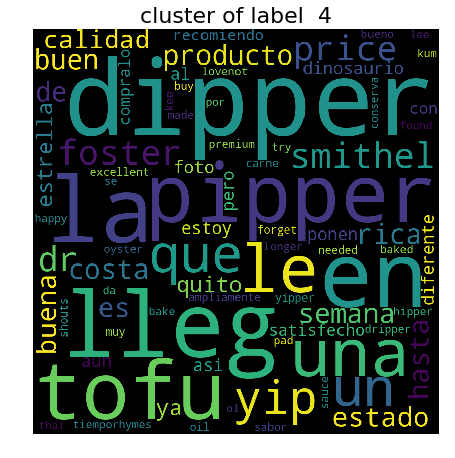

cluster  label of 5 has no words


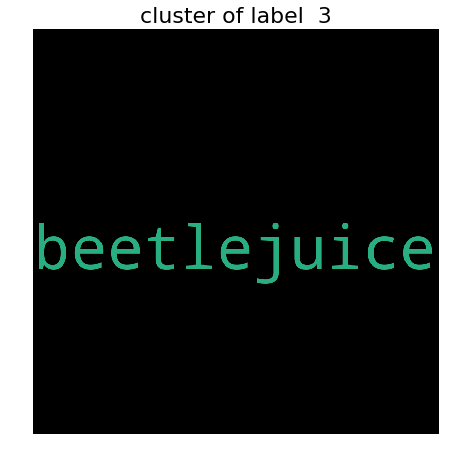

In [33]:
print("Aggolomerative clustering, number of cluster is 7")
label_df = pd.DataFrame(agg_cls_7.labels_)

label = (agg_cls_7.labels_).reshape(-1 )

text_label = pd.DataFrame(columns = {'Text', 'label'})
                                     
df = pd.DataFrame({'Text':  x_train,
                  'label' : label} )


for i in label_df[0].value_counts().index:
    text_label.loc[i, 'label'] = i
    text_label.loc[i, 'Text'] = ''
    for j in range(len(df.label)):
        if i == df.iloc[j].label:
            text_label.loc[i, 'Text'] = str(text_label.loc[i, 'Text']) + df.iloc[j, 0]
            
for i in label_df[0].value_counts().index:
    if '' != text_label.loc[i].Text:
        wordcloud = WordCloud(width = 800, height = 800, 
                    background_color ='black',        
                    min_font_size = 5).generate(text_label.loc[i].Text)

        plt.figure(figsize = (6, 6), facecolor = None) 
        plt.imshow(wordcloud) 
        plt.axis("off") 
        plt.tight_layout(pad = 0) 
        plt.title("cluster of label  " + str(i), fontsize=22)  
        plt.show()                   
    else:
        print('cluster  label of ' +str(i) + ' has no words')

Aggolomerative clustering, number of cluster is 10


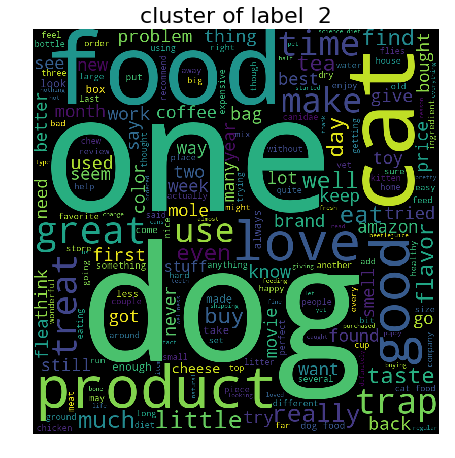

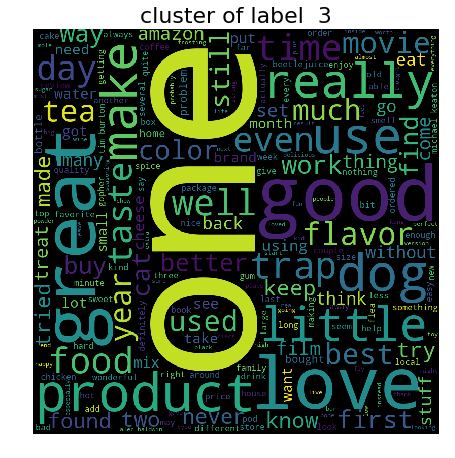

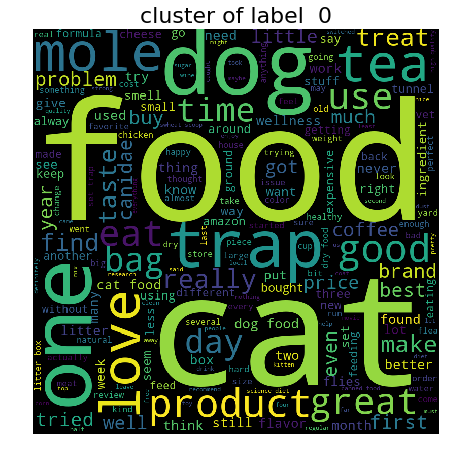

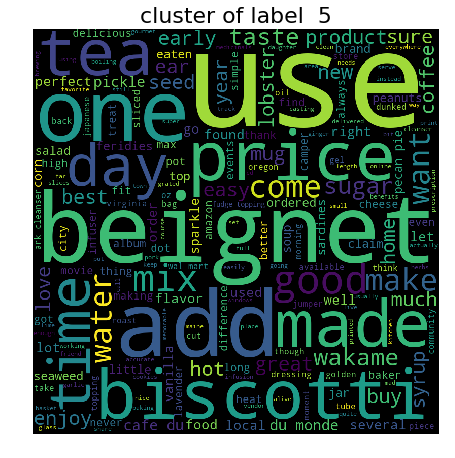

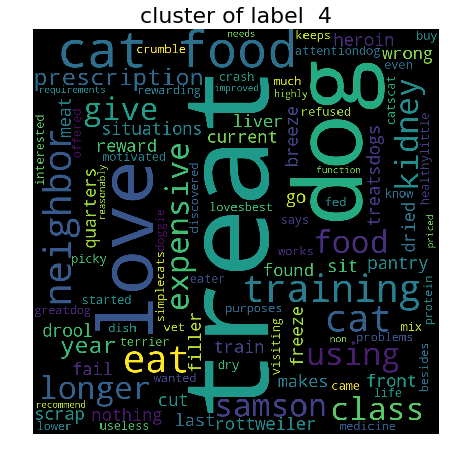

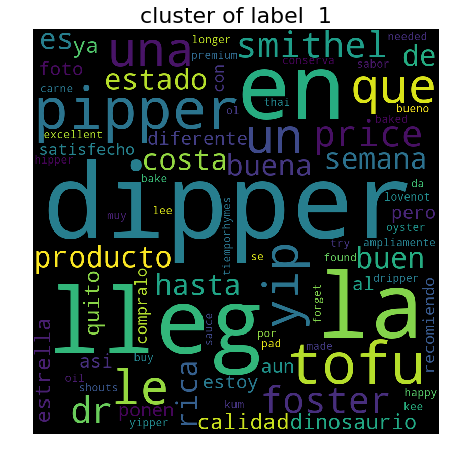

cluster  label of 8 has no words


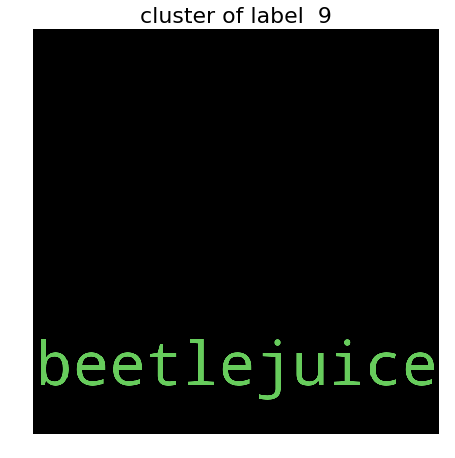

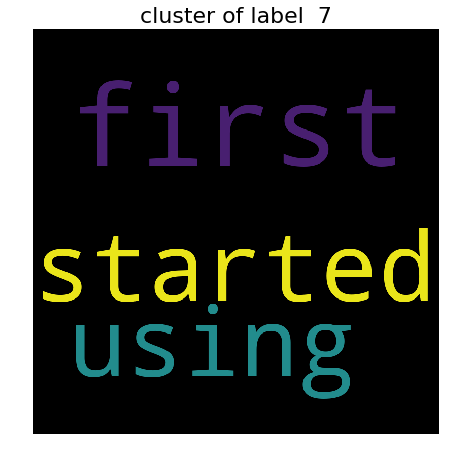

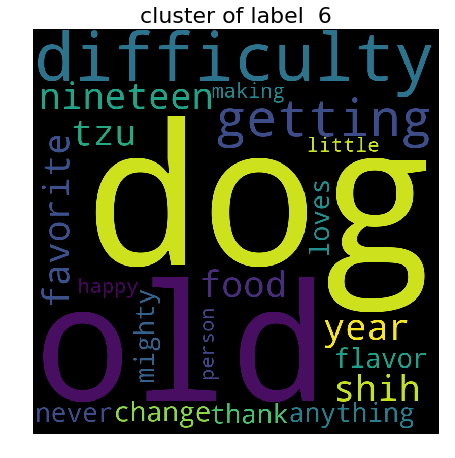

In [34]:
print("Aggolomerative clustering, number of cluster is 10")
label_df = pd.DataFrame(agg_cls_10.labels_)

label = (agg_cls_10.labels_).reshape(-1 )

text_label = pd.DataFrame(columns = {'Text', 'label'})
                                     
df = pd.DataFrame({'Text':  x_train,
                  'label' : label} )


for i in label_df[0].value_counts().index:
    text_label.loc[i, 'label'] = i
    text_label.loc[i, 'Text'] = ''
    for j in range(len(df.label)):
        if i == df.iloc[j].label:
            text_label.loc[i, 'Text'] = str(text_label.loc[i, 'Text']) + df.iloc[j, 0]
            
for i in label_df[0].value_counts().index:
    if '' != text_label.loc[i].Text:
        wordcloud = WordCloud(width = 800, height = 800, 
                    background_color ='black',        
                    min_font_size = 5).generate(text_label.loc[i].Text)

        plt.figure(figsize = (6, 6), facecolor = None) 
        plt.imshow(wordcloud) 
        plt.axis("off") 
        plt.tight_layout(pad = 0) 
        plt.title("cluster of label  " + str(i), fontsize=22)  
        plt.show()                   
    else:
        print('cluster  label of ' +str(i) + ' has no words')

## [5.3] DBSCAN Clustering

In [35]:
from sklearn.cluster import DBSCAN
from scipy.spatial import distance

### [5.3.1] Applying DBSCAN on AVG W2V,<font color='red'> SET 3</font>

In [36]:
# Please write all the code with proper documentation
dist = []
for i in tqdm(range(len(avg_w2v_x_train))):
    key = avg_w2v_x_train[i]
    min_pts_dist = [1000]*6
    for j in range(len(avg_w2v_x_train)):
        if i != j:
            dst = distance.euclidean(key, avg_w2v_x_train[j])
            for k in range(len(min_pts_dist)):
                if min_pts_dist[k] > dst:
                    for m in range((len(min_pts_dist)-2), k, -1):
                        min_pts_dist[m+1] = min_pts_dist[m]
                    min_pts_dist[k] = dst
                    
    dist.append(min_pts_dist[len(min_pts_dist)-1])                

In [37]:
sorted_dist = sorted(dist)


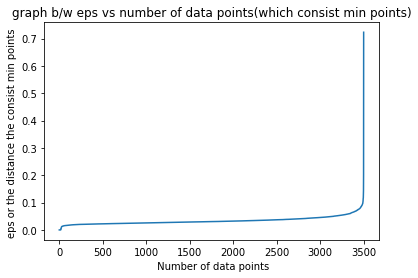

In [38]:
plt.plot(range(len(x_train)), sorted_dist)
plt.xlabel(" Number of data points")
plt.ylabel("eps or the distance the consist min points ")
plt.title("graph b/w eps vs number of data points(which consist min points)")
plt.show()

In [53]:
eps  = 0.6

In [54]:
dbscan = DBSCAN(eps= eps, min_samples=6).fit(avg_w2v_x_train)

### [5.3.2] Wordclouds of clusters obtained after applying DBSCAN on AVG W2V<font color='red'> SET 3</font>

In [55]:
# Please write all the code with proper documentation

DBSCAN clustering


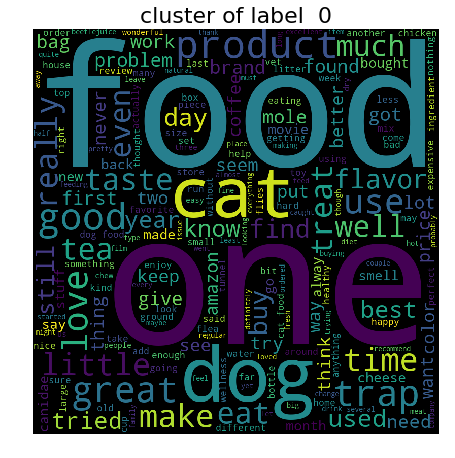

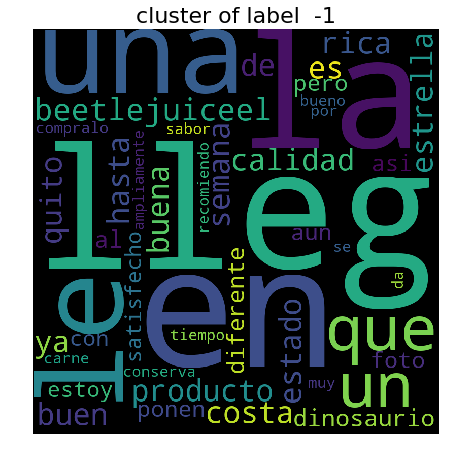

In [56]:
print("DBSCAN clustering")
label_df = pd.DataFrame(dbscan.labels_)

label = (dbscan.labels_).reshape(-1 )

text_label = pd.DataFrame(columns = {'Text', 'label'})
                                     
df = pd.DataFrame({'Text':  x_train,
                  'label' : label} )


for i in label_df[0].value_counts().index:
    text_label.loc[i, 'label'] = i
    text_label.loc[i, 'Text'] = ''
    for j in range(len(df.label)):
        if i == df.iloc[j].label:
            text_label.loc[i, 'Text'] = str(text_label.loc[i, 'Text']) + df.iloc[j, 0]
            
for i in label_df[0].value_counts().index:
    if '' != text_label.loc[i].Text:
        wordcloud = WordCloud(width = 800, height = 800, 
                    background_color ='black',        
                    min_font_size = 5).generate(text_label.loc[i].Text)

        plt.figure(figsize = (6, 6), facecolor = None) 
        plt.imshow(wordcloud) 
        plt.axis("off") 
        plt.tight_layout(pad = 0) 
        plt.title("cluster of label  " + str(i), fontsize=22)  
        plt.show()                   
    else:
        print('cluster  label of ' +str(i) + ' has no words')

### [5.3.3] Applying DBSCAN on TFIDF W2V,<font color='red'> SET 4</font>

In [153]:
# Please write all the code with proper documentation

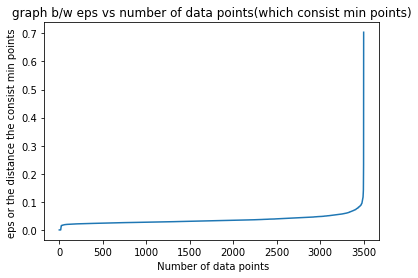

In [39]:
# Please write all the code with proper documentation
dist = []
for i in tqdm(range(len(tfidf_w2v_x_train))):
    key = tfidf_w2v_x_train[i]
    min_pts_dist = [1000]*8
    for j in range(len(tfidf_w2v_x_train)):
        if i != j:
            dst = distance.euclidean(key, tfidf_w2v_x_train[j])
            for k in range(len(min_pts_dist)):
                if min_pts_dist[k] > dst:
                    for m in range((len(min_pts_dist)-2), k, -1):
                        min_pts_dist[m+1] = min_pts_dist[m]
                    min_pts_dist[k] = dst
                    
    dist.append(min_pts_dist[len(min_pts_dist)-1])      
        
sorted_dist = sorted(dist)    

plt.plot(range(len(x_train)), sorted_dist)
plt.xlabel(" Number of data points")
plt.ylabel("eps or the distance the consist min points ")
plt.title("graph b/w eps vs number of data points(which consist min points)")
plt.show()


In [50]:
eps  = 0.6
dbscan = DBSCAN(eps= eps, min_samples=8).fit(tfidf_w2v_x_train)

### [5.3.4] Wordclouds of clusters obtained after applying DBSCAN on TFIDF W2V<font color='red'> SET 4</font>

In [51]:
# Please write all the code with proper documentation

DBSCAN clustering


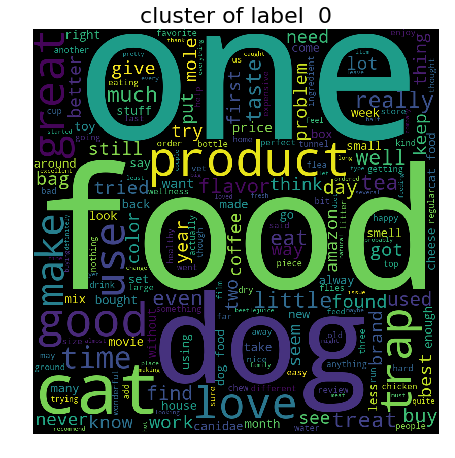

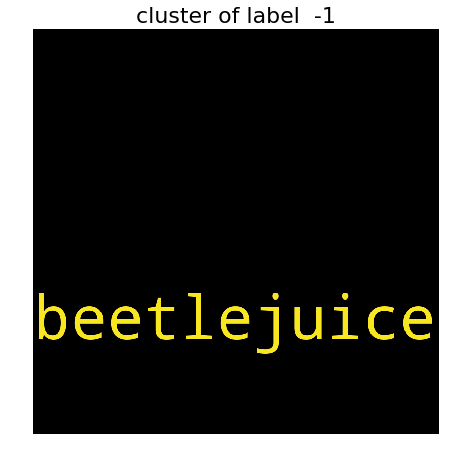

In [52]:
print("DBSCAN clustering")
label_df = pd.DataFrame(dbscan.labels_)

label = (dbscan.labels_).reshape(-1 )

text_label = pd.DataFrame(columns = {'Text', 'label'})
                                     
df = pd.DataFrame({'Text':  x_train,
                  'label' : label} )


for i in label_df[0].value_counts().index:
    text_label.loc[i, 'label'] = i
    text_label.loc[i, 'Text'] = ''
    for j in range(len(df.label)):
        if i == df.iloc[j].label:
            text_label.loc[i, 'Text'] = str(text_label.loc[i, 'Text']) + df.iloc[j, 0]
            
for i in label_df[0].value_counts().index:
    if '' != text_label.loc[i].Text:
        wordcloud = WordCloud(width = 800, height = 800, 
                    background_color ='black',        
                    min_font_size = 5).generate(text_label.loc[i].Text)

        plt.figure(figsize = (6, 6), facecolor = None) 
        plt.imshow(wordcloud) 
        plt.axis("off") 
        plt.tight_layout(pad = 0) 
        plt.title("cluster of label  " + str(i), fontsize=22)  
        plt.show()                   
    else:
        print('cluster  label of ' +str(i) + ' has no words')

# [6] Conclusions

In [ ]:
# Please compare all your models using Prettytable library. 
# You can have 3 tables, one each for kmeans, agllomerative and dbscan

Explanation of all above code:
    1. kmean clustering with BoW, tfidf, avg word2vec and tfidf word2vec:
        * I fit 30k points of BoW, tfidf, avg word2vec and tfidf word2vec
          vectorizer into kmeans model and plotted sum of sqaure error with \
          corresponding k vlaue 
        * opbserve the knee point of elbow graph and took as optimal k value
        * Then fit optimal k with k mean model and got label of each data point
        * Then plotted word cloud of each cluster label which have same label
          for example : 1,4,5, 7, 875, 767, 878 have label 0  and then using
                code i combine all text of same label and found word cloud of 
                label.Did same for all cluster label
                Note: some cluster label has not even a single text and i was
                      written that that cluster  has no words
                        
    2. Agglomerative clustering with avg word2vec and tfidf word2vec:
        * i fit 3.5k points into agglomerative model and manually took 3, 5, 7
          number of cluster.
        * corresponding to each cluster i got label and plotted word cloud same
          as kmean
    3. DBSCAN with avg word2vec:
        * i took min pts 6 for avg word2vec and found min distance or eps of 
          every data  point that contains min 6 words
        * after that i sorted the all distance or eps that i calulated 
          and plotted on the grapgh between number data points vs eps
        * and obseterve that where grapgh sharp change and declare that after that
          all  eps value contains noisy points
    4. DBSCAN with tfidf word2vec:
        * i took min pts 8 for avg word2vec and found min distance or eps of 
          every data  point that contains min 8 words
        * after that i sorted the all distance or eps that i calulated 
          and plotted on the grapgh between number data points vs eps
        * and obseterve that where grapgh sharp change and declare that after that
          all  eps value contains noisy points
                                       
                
        